# SkinAnaliticAI, Skin Cancer Detection with AI Deep Learning

## __Evaluation of Harvard Dataset with different AI classiffication techniques using FastClassAI papeline__
Author: __Pawel Rosikiewicz__   
prosikiewicz@gmail.com      
License: __MIT__    
ttps://opensource.org/licenses/MIT        
Copyright (C) 2021.01.30 Pawel Rosikiewicz 

# standard imports

In [1]:
import os # allow changing, and navigating files and folders, 
import sys
import shutil
import re # module to use regular expressions, 
import glob # lists names in folders that match Unix shell patterns
import numpy as np
import warnings
import pickle
import pandas as pd
import seaborn as sns # advance plots, for statistics, 
import matplotlib as mpl # to get some basif functions, heping with plot making 
import matplotlib.pyplot as plt # for making plots, 
from sklearn.model_selection import ParameterGrid
from tensorflow.keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings("ignore")

In [2]:
# setup basedir
basedir = os.path.dirname(os.getcwd())
os.chdir(basedir)
sys.path.append(basedir)

# project paths
PATH_raw                            = os.path.join(basedir, "data/raw")
PATH_interim                        = os.path.join(basedir, "data/interim")
PATH_models                         = os.path.join(basedir, "models")
PATH_interim_dataset_summary_tables = os.path.join(PATH_interim, "dataset_summary_tables") # create in that notebook,
PATH_results                        = os.path.join(basedir, "data/results")

# load functions
from src.utils.FastClassAI_skilearn_tools import train_skilearn_models_iteratively
from src.utils.FastClassAI_dense_nn_tools import train_dense_network_NN_models_iteratively
from src.utils.FastClassAI_model_summary_tools import load_summary_files
from src.utils.FastClassAI_model_summary_tools import create_new_df_feature
from src.utils.FastClassAI_model_summary_tools import simple_visual_model_summary
from src.utils.FastClassAI_model_summary_tools import prepare_summary_df
from src.utils.FastClassAI_model_summary_tools import create_boxplot_with_color_classes
from src.utils.FastClassAI_model_summary_tools import preapre_table_with_n_best_results_in_each_group
from src.utils.FastClassAI_cnn_models import TwoConv_OneNN_model
from src.utils.FastClassAI_denovocnn_tools import train_denovoCNN_models_iteratively

# load configs
from src.configs.project_configs import CLASS_DESCRIPTION # information on each class, including descriptive class name and diegnostic description - used to help wiht the project
from src.configs.tfhub_configs import TFHUB_MODELS # names of TF hub modules that I presenlected for featuress extraction with all relevant info,
from src.configs.dataset_configs import DATASET_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import CLASS_LABELS_CONFIGS # names created for clases, assigned to original one, and colors assigned to these classes
from src.configs.dataset_configs import DROPOUT_VALUE # str, special value to indicate samples to remoce in class labels
from src.configs.config_functions import DEFINE_DATASETS # function that creates datasunbsets collections for one dataset (custome made for that project)
from src.configs.denovocnn_configs import MODEL_PARAMETERS_GRID # dict, key: method name, value: ParameterGrid
from src.configs.denovocnn_configs import DATASETS_DESCRIPTION

# set project variables
DATASET_NAME                   = "HAM10000"  # name used in config files to identify all info on that dataset variant
DATASET_VARIANTS               = DATASET_CONFIGS[DATASET_NAME]["labels"] # class labels that will beused, SORT_FILES_WITH   must be included
MODULE_NAME                    = None
SUBSET_COLLECTION_NAMES        = ["small_subset_data", "all_data"] # in order they will be used, 
AI_METHOD                      = "cnn"
MODEL_FUNCTION                 = TwoConv_OneNN_model

# TRAIN MODELS
* model parameters are in config files, 
* here is the fucntion that performs grid search on these parameters using smaller subset of data, and then it usese parameters from best performing models to train new models with all available data
* part 2 . contains first simple model summary, where you can visually avaluate the result, but more is in separate notebook, 

0. Evaluating 15 cnn models for:
   .... Cancer_Detection_And_Classification, None .... ['small_subset_data', 'all_data']

 - - - CYCLE: 0 - - -



..................................................
model_ID: 0
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test

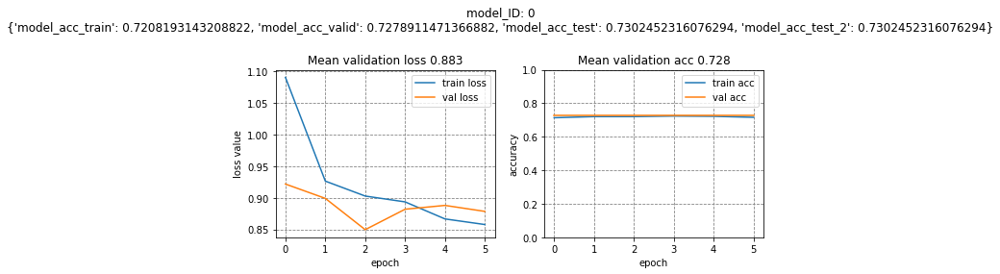



..................................................
model_ID: 1
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_2"
__

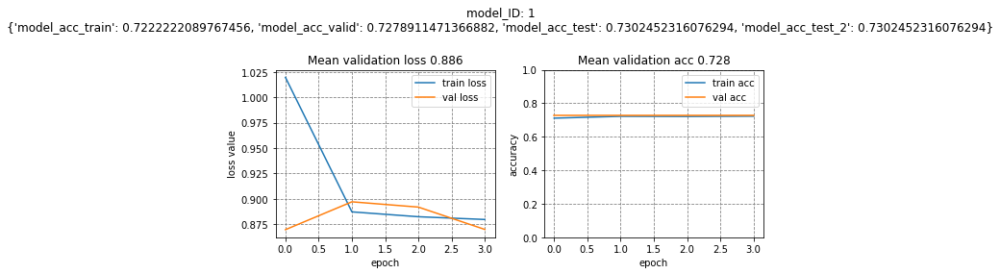



..................................................
model_ID: 2
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_3"
__

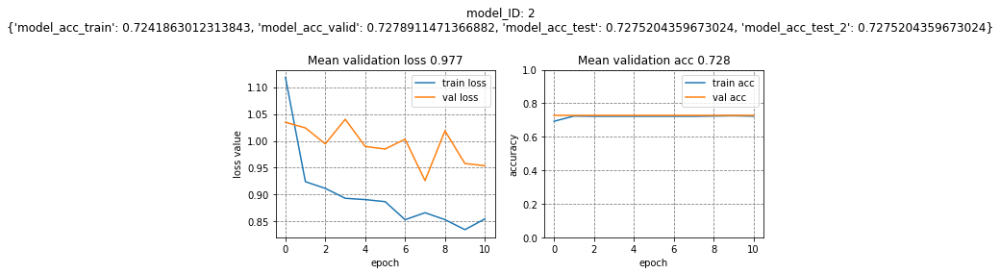



..................................................
model_ID: 3
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_4"
__

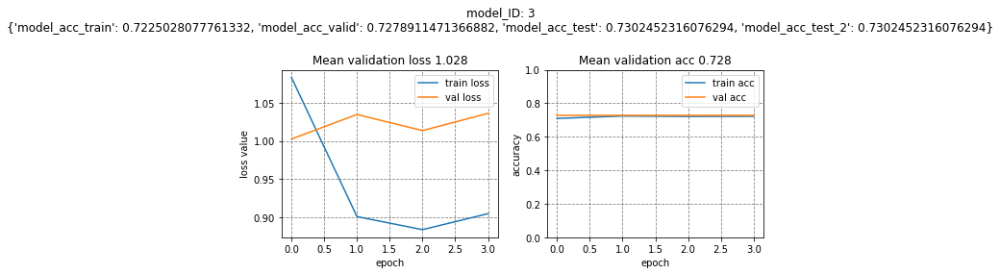



..................................................
model_ID: 4
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_5"
__

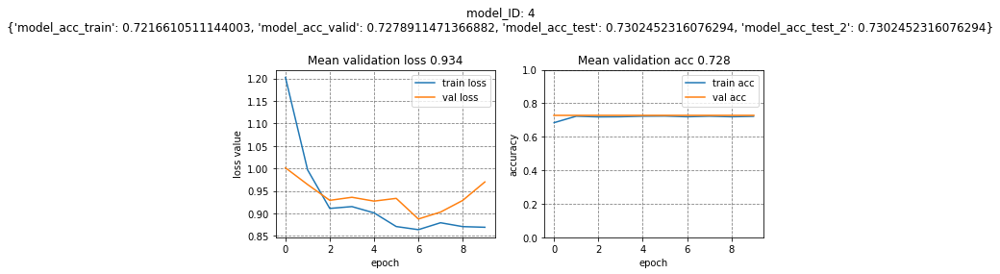



..................................................
model_ID: 5
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_6"
__

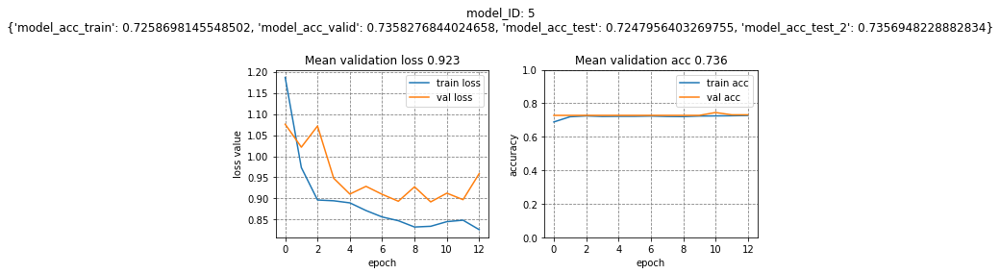



..................................................
model_ID: 6
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_7"
__

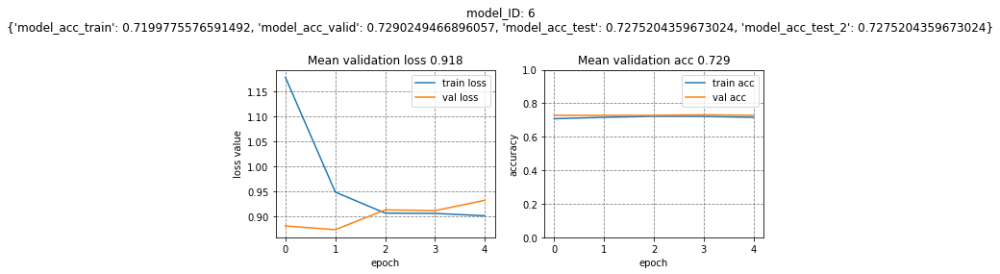



..................................................
model_ID: 7
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_8"
__

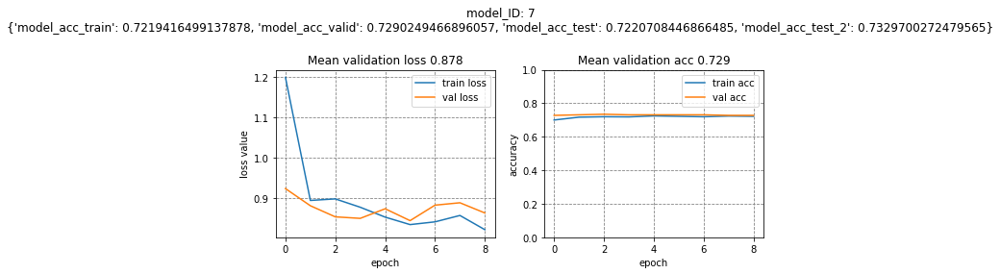



..................................................
model_ID: 8
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_9"
__

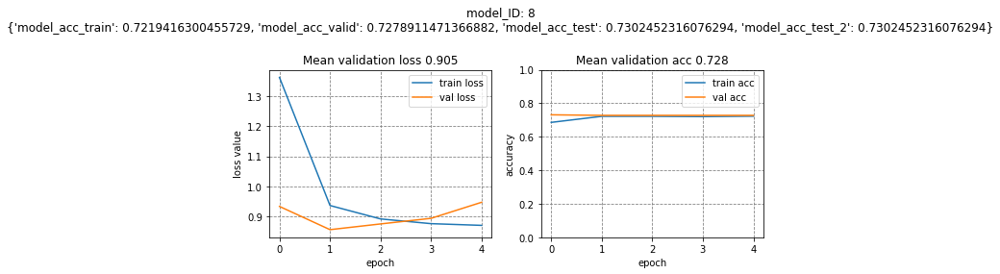



..................................................
model_ID: 9
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_10"
_

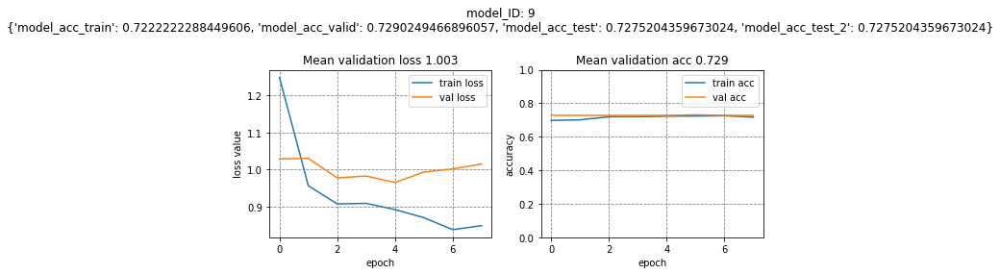



..................................................
model_ID: 10
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_11"


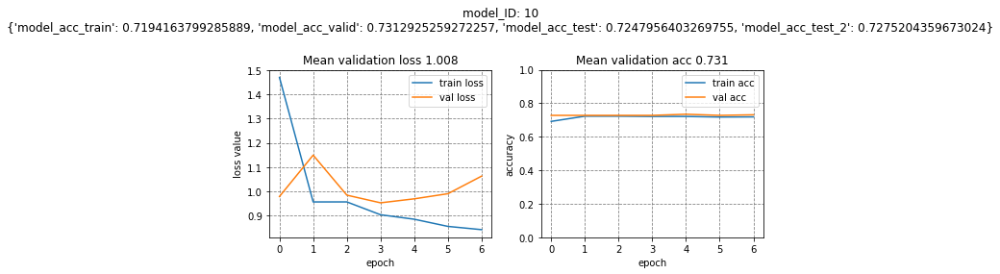



..................................................
model_ID: 11
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_12"


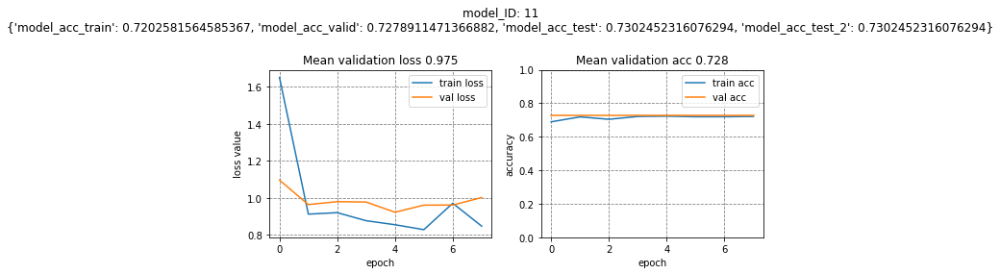



..................................................
model_ID: 12
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_13"


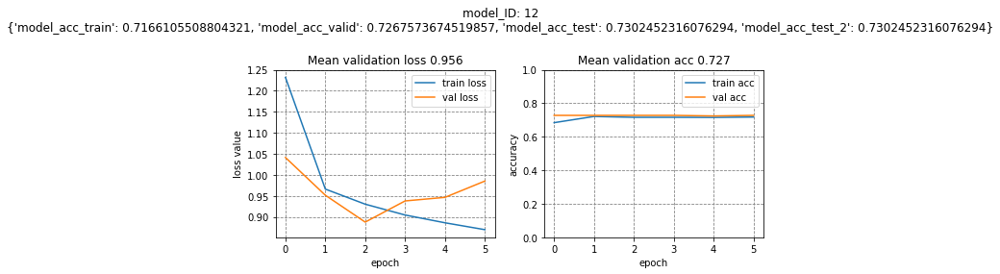



..................................................
model_ID: 13
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_14"


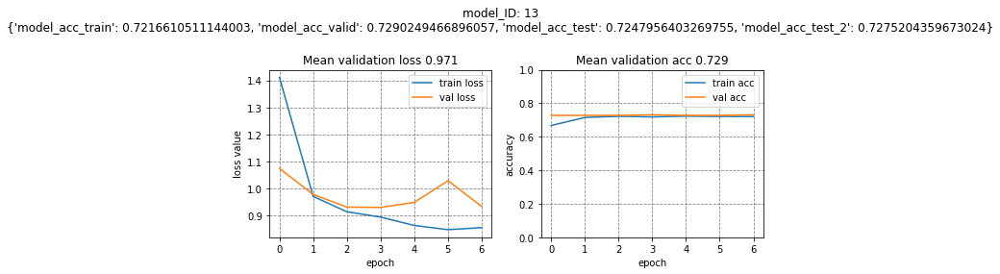



..................................................
model_ID: 14
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 7 classes.
Found 294 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_15"


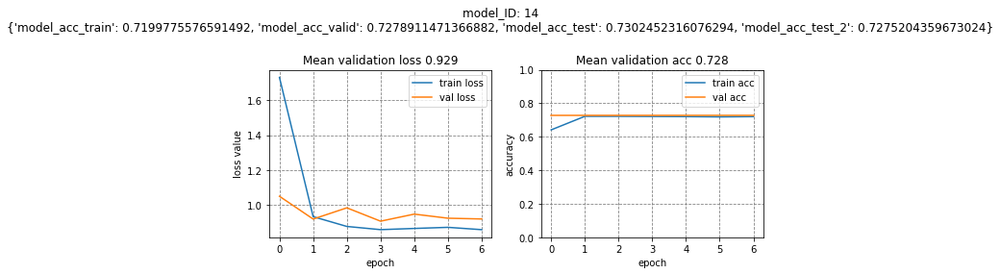

The results will be saved with as:
cnn__HAM10000__Cancer_Detection_And_Classification__None__small_subset_data__run01

 - - - CYCLE: 1 - - -



..................................................
model_ID: 0
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: all_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 6019 images belonging to 7 classes.
Found 665 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
       subset_dirname subset_results_name subset_role        status
0  trainvalid_all_cnn               train       train       Loading
1                 0.1               valid       valid  0.1 of train
2             test_01                te

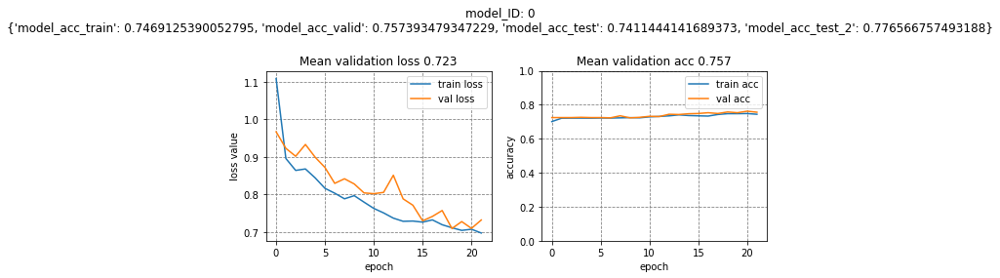



..................................................
model_ID: 1
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: all_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Detection_And_Classification
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 6019 images belonging to 7 classes.
Found 665 images belonging to 7 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
       subset_dirname subset_results_name subset_role        status
0  trainvalid_all_cnn               train       train       Loading
1                 0.1               valid       valid  0.1 of train
2             test_01                test        test       awating
3             test_02              test_2        test       awating


Model: "sequential_17"
____________________

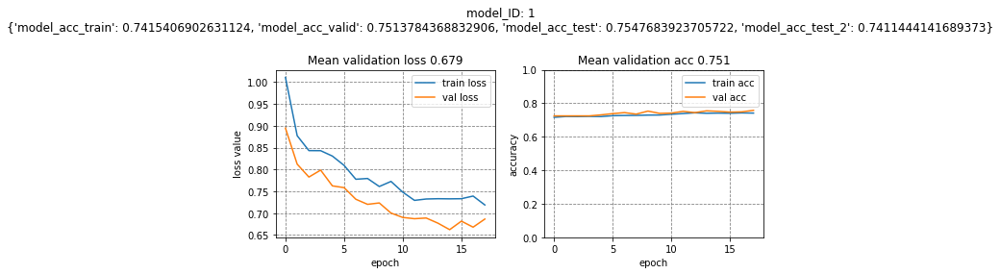

The results will be saved with as:
cnn__HAM10000__Cancer_Detection_And_Classification__None__all_data__run01
1. Evaluating 15 cnn models for:
   .... Cancer_Risk_Groups, None .... ['small_subset_data', 'all_data']

 Crated: /Users/pawel/Desktop/Activities/100__Projects/SkinDiagnosticAI/data/results/cnn__HAM10000__Cancer_Risk_Groups


 - - - CYCLE: 0 - - -



..................................................
model_ID: 0
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_res

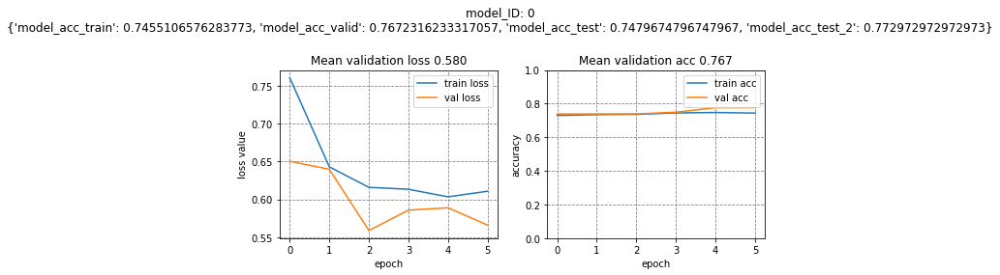



..................................................
model_ID: 1
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_19"
__________________

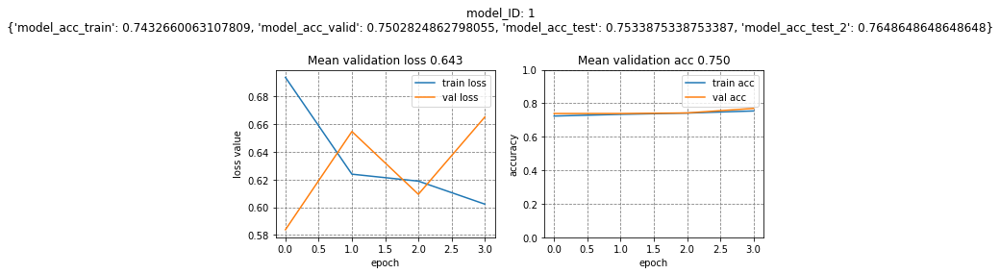



..................................................
model_ID: 2
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_20"
__________________

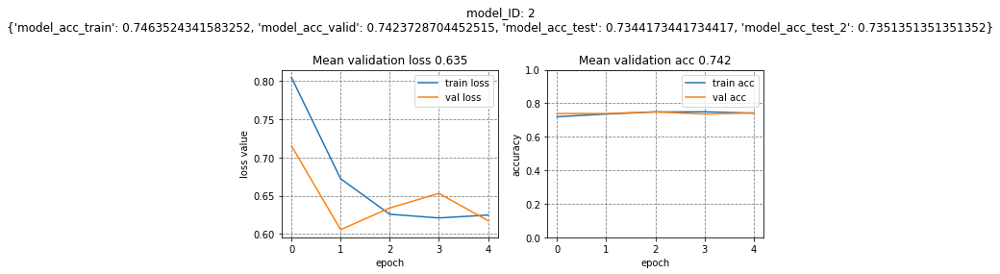



..................................................
model_ID: 3
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_21"
__________________

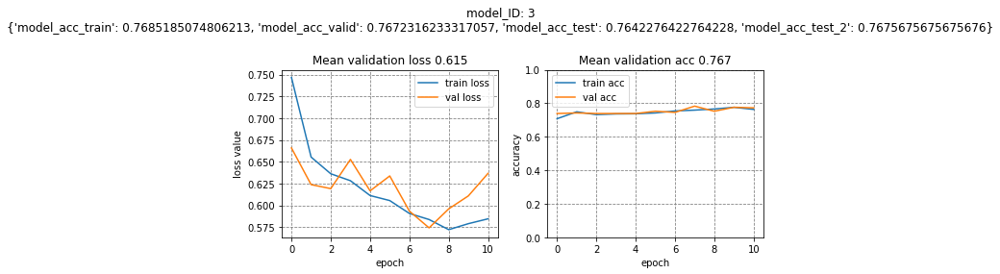



..................................................
model_ID: 4
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_22"
__________________

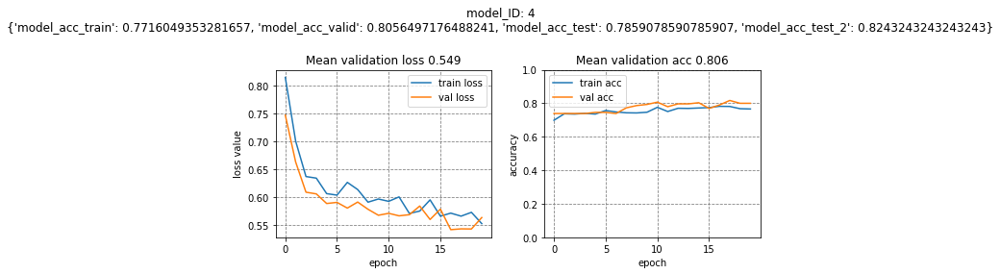



..................................................
model_ID: 5
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_23"
__________________

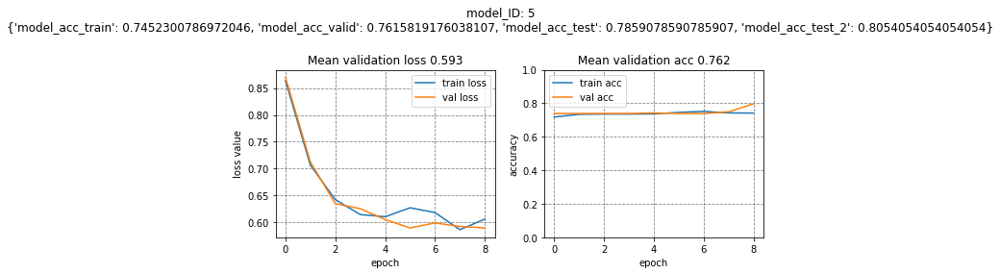



..................................................
model_ID: 6
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_24"
__________________

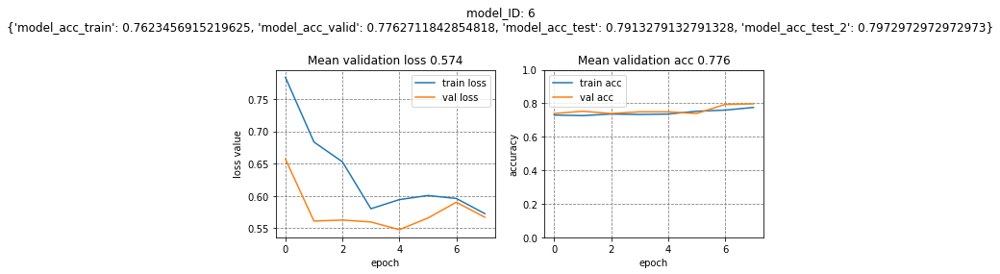



..................................................
model_ID: 7
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_25"
__________________

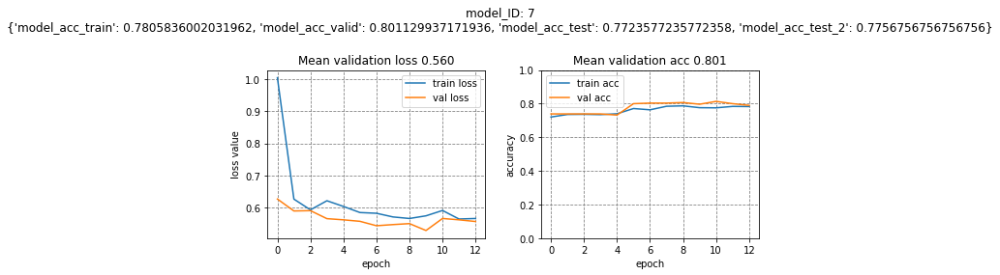



..................................................
model_ID: 8
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_26"
__________________

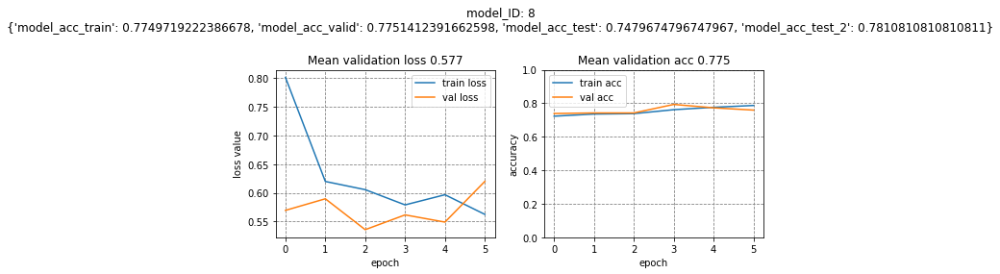



..................................................
model_ID: 9
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_27"
__________________

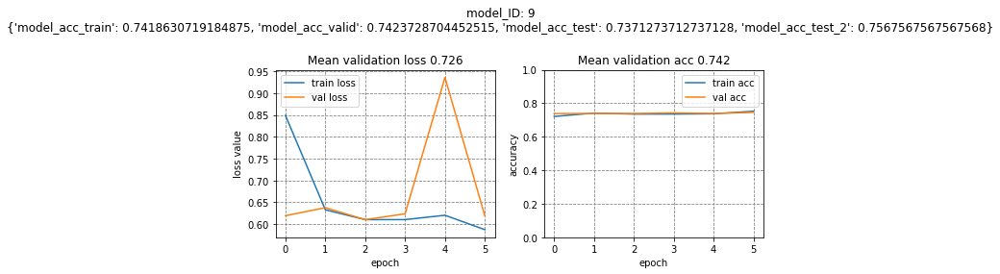



..................................................
model_ID: 10
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_28"
_________________

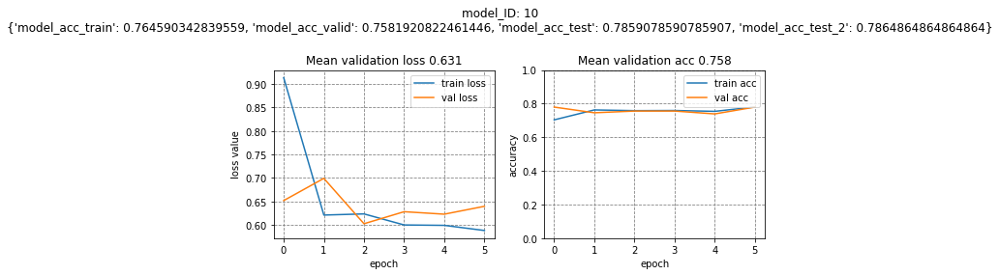



..................................................
model_ID: 11
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 32
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_29"
_________________

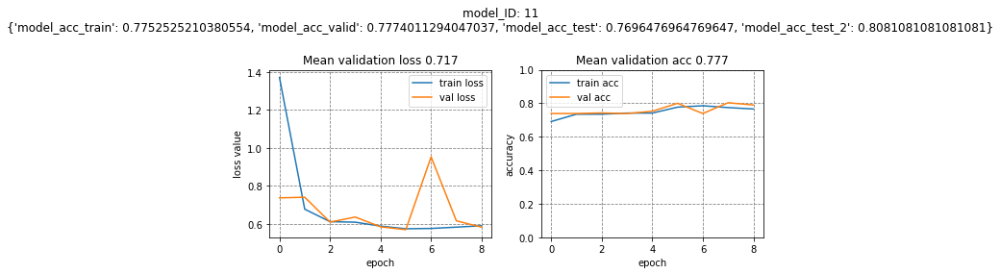



..................................................
model_ID: 12
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_30"
_________________

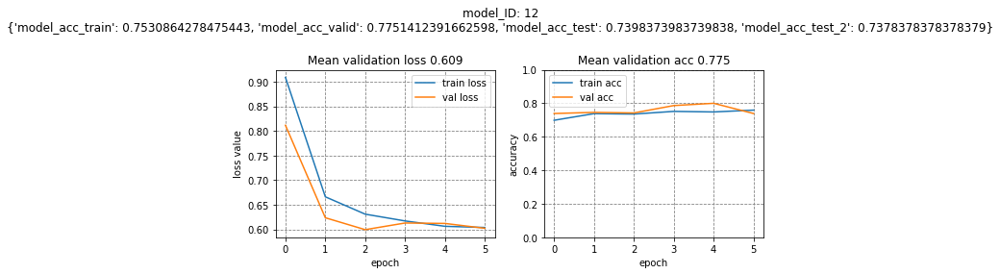



..................................................
model_ID: 13
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_31"
_________________

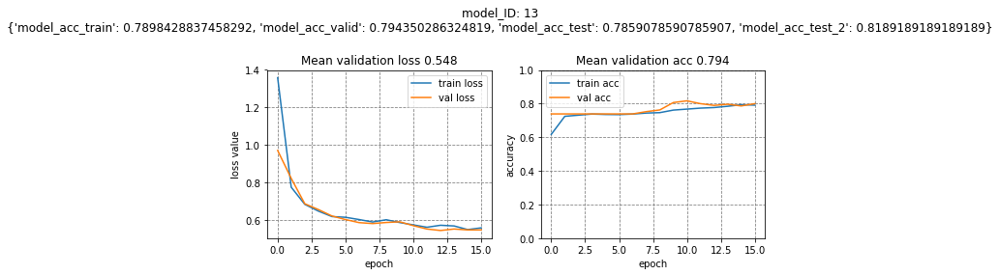



..................................................
model_ID: 14
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: small_subset_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (256, 256)
epoch: 100
..................................................

Found 1188 images belonging to 3 classes.
Found 295 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
         subset_dirname subset_results_name subset_role        status
0  trainvalid_small_cnn               train       train       Loading
1                   0.2               valid       valid  0.2 of train
2               test_01                test        test       awating
3               test_02              test_2        test       awating


Model: "sequential_32"
_________________

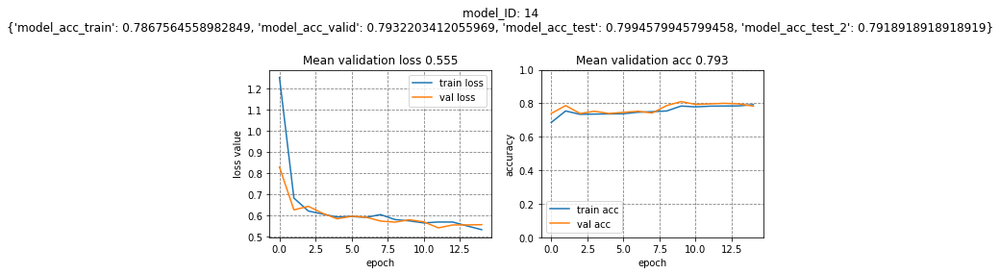

The results will be saved with as:
cnn__HAM10000__Cancer_Risk_Groups__None__small_subset_data__run01

 - - - CYCLE: 1 - - -



..................................................
model_ID: 0
method_group: denovo_cnn
method: cnn
method_variant: res_128_pixels
............................... input data ...
run_name: all_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 64
img_size: (128, 128)
epoch: 100
..................................................

Found 6012 images belonging to 3 classes.
Found 667 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
       subset_dirname subset_results_name subset_role        status
0  trainvalid_all_cnn               train       train       Loading
1                 0.1               valid       valid  0.1 of train
2             test_01                test        test       awating
3    

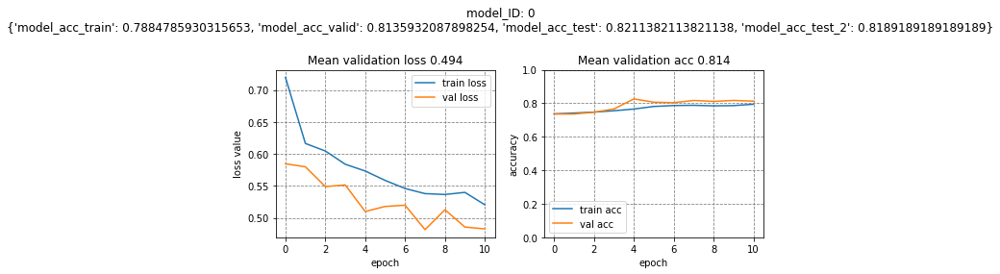



..................................................
model_ID: 1
method_group: denovo_cnn
method: cnn
method_variant: res_256_pixels
............................... input data ...
run_name: all_data__run01
dataset_name: HAM10000
dataset_variant: Cancer_Risk_Groups
unit_test: False
............................... basic params ...
random_state_nr: 0
batch_size: 16
img_size: (256, 256)
epoch: 100
..................................................

Found 6012 images belonging to 3 classes.
Found 667 images belonging to 3 classes.
Datagenerator parameters:  imgadatagen prams provided by the user
       subset_dirname subset_results_name subset_role        status
0  trainvalid_all_cnn               train       train       Loading
1                 0.1               valid       valid  0.1 of train
2             test_01                test        test       awating
3             test_02              test_2        test       awating


Model: "sequential_34"
_____________________________________

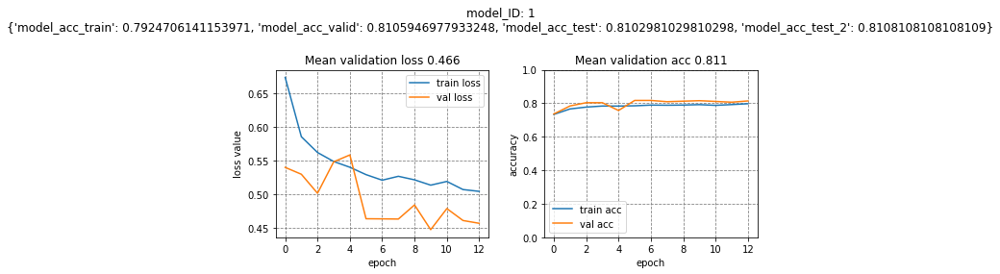

The results will be saved with as:
cnn__HAM10000__Cancer_Risk_Groups__None__all_data__run01


In [4]:
# set general prameters, that are the same to all cycles and grid search functions
general_parameters   = dict(
    run_ID                  = "run01",
    save_path               = PATH_results,
    save_partial_results    = True,     
    unit_test               = False,
    model_fit__verbose      = 1,
    verbose                 = True
) 

counter = 0
for dataset_variant in DATASET_VARIANTS:

    # define model paramters and input data and how models are selected at each cycle, 
    model_parameters = dict(
        method_name                                 = AI_METHOD,
        grid                                        = MODEL_PARAMETERS_GRID[AI_METHOD],        
        cnn_model_function                          = MODEL_FUNCTION,                   # function providing sequencian keras model, and list with 
        datagen_params                              = dict(rescale =1/255),             # default datagenerator parameters applied to all data
        # .......................................
        models_selected_at_each_cycle               = 0.1,              # int, or float, if float, a top franction is used, if int, a top nr of models is used, 
        include_method_variant_with_selection       = True,             # bool, if True, top models_selected_at_each_cycle wiht different model variant will be selected to next cycle
        include_random_nr_with_selection            = False,            # bool, if True, top models_selected_at_each_cycle wiht different random nr will be selected to next cycle
        sort_models_by                              = "model_acc_valid",# str {"model_acc_valid", "model_acc_train", "model_acc_test"}, in the future I will add other metrics 
        find_min_score                              = False,            # if false, the scores will be used in descending order, 
        )
    
    # all imput data params, 
    input_data = dict(
        dataset_name            = DATASET_NAME,
        dataset_variant         = dataset_variant,
        module_name             = MODULE_NAME,     
        # .......................................
        path                    = os.path.join(PATH_interim, f"{DATASET_NAME}__{dataset_variant}"),  # str, or list of the same lengh and order as subset_collection_names, path to input data
        subset_collection_names = SUBSET_COLLECTION_NAMES,       # list, anything that will allow you to identify which subset and run you are using             
        input_data_info_df_dict = DATASETS_DESCRIPTION,               # dict, with input_data_info_df, each is df, with 3. columns, subset_role/results_name/dirname
        valid_proportion        = 0.2, # float, 0-1, on how much of the data shdould be randomly sorted into train subset, used only if valid datasusbet role is == None,  
        )
                

    # info:
    print(f"{counter}. Evaluating {len(MODEL_PARAMETERS_GRID[AI_METHOD])} {AI_METHOD} models for:"); counter+=1
    print(f"   .... {dataset_variant}, {MODULE_NAME} .... {input_data['subset_collection_names']}")  
    
    # train, 
    train_denovoCNN_models_iteratively(
        **general_parameters,
        **model_parameters, 
        **input_data
        )


## Create figure with accuracy results from each method

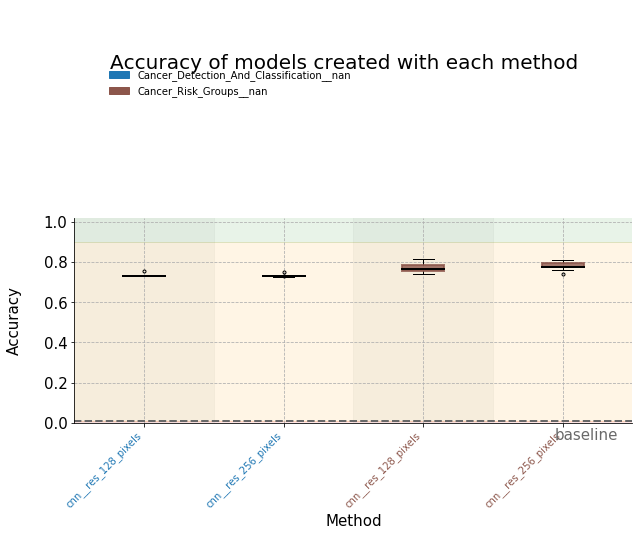

In [5]:
summary_df = prepare_summary_df(
        dataset_name         = DATASET_NAME,
        dataset_variants     = DATASET_VARIANTS,
        module_names         = [MODULE_NAME],
        ai_methods           = list(MODEL_PARAMETERS_GRID.keys()),
        keywords             = ["summary_table.csv"],
        path_results         = PATH_results,
        verbose=False                            
)

fig = create_boxplot_with_color_classes(summary_df=summary_df, baseline=summary_df.baseline_acc_test.iloc[0]); fig.show()

## show table with accuracy results for n best performing models of each type 

In [6]:
sorted_best_methods_summary_df = preapre_table_with_n_best_results_in_each_group(
    summary_df = summary_df,              
    n_top_methods = 1,
    display_table=True
)

,dataset_variant,module,method,method_variant,model_acc_train,model_acc_valid,model_acc_test,baseline_acc_test,pca_components_used,run_name
0,Cancer_Risk_Groups,NaN,cnn,res_128_pixels,0.788479,0.813593,0.821138,0.081301,0,all_data__run01
1,Cancer_Risk_Groups,NaN,cnn,res_256_pixels,0.792471,0.810595,0.810298,0.081301,0,all_data__run01
2,Cancer_Detection_And_Classification,NaN,cnn,res_128_pixels,0.746913,0.757393,0.741144,0.008174,0,all_data__run01
3,Cancer_Detection_And_Classification,NaN,cnn,res_256_pixels,0.741541,0.751378,0.754768,0.008174,0,all_data__run01


# Show Predictions made with the best performing model for test data
---

* The best model was selected using validation accuracy, from all compared models in that section, 
* border colors arround each picture show true class of that image (see legend, for class-color pairs),
* the groups of images (labelled on top of each group), show classyfication made by the model,
* the probability values displayed on each image were calculated using model.predict_proba() function, 
* Predictions in each group were summarized, on pie plots below the main figure, 
* you may double click on the image to make it larger, 

Found 369 images belonging to 3 classes.


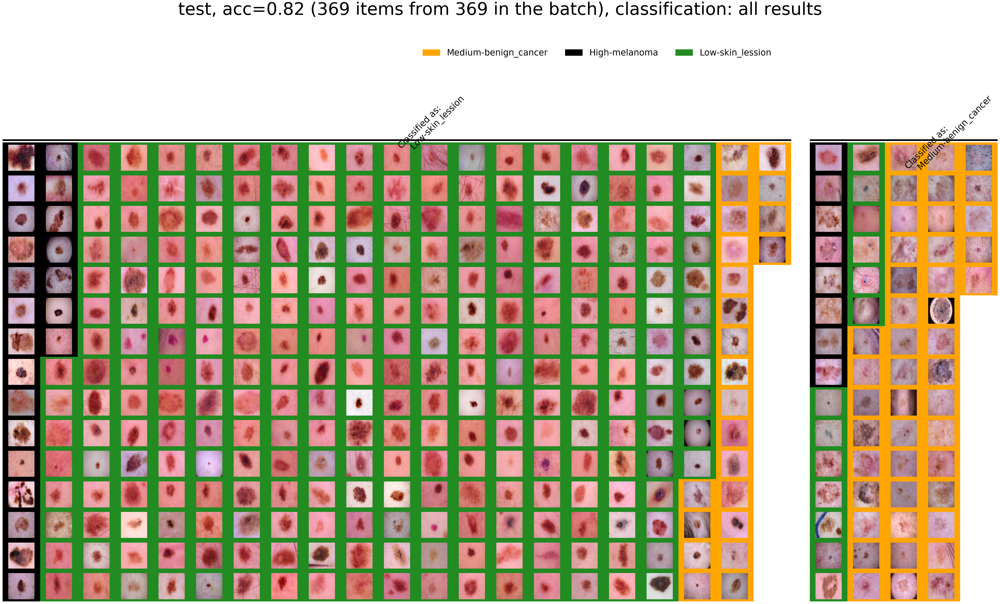

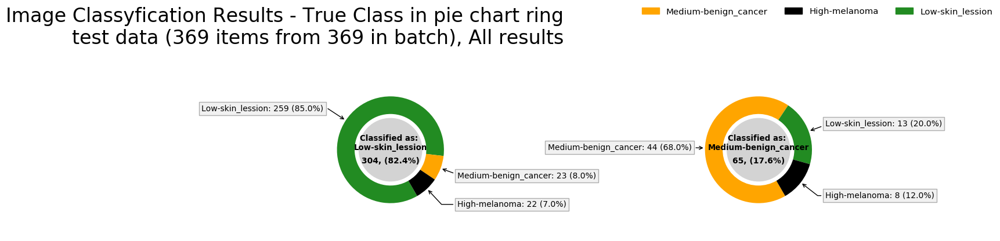

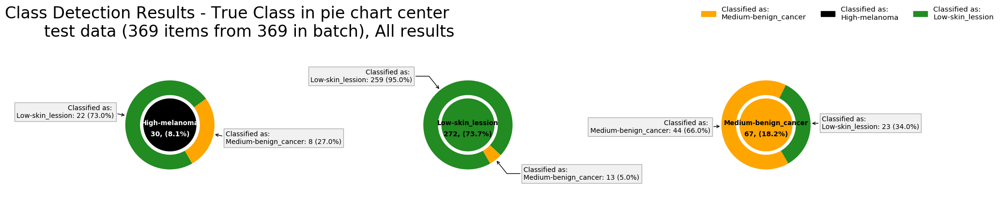

In [7]:
simple_visual_model_summary(
    model_idx_in_sorted_summary_df= 0, # idx in sorted_best_methods_summary_df, not model ID that is repeated in each model search group
    subset_collection_name        = "test",
    batch_names_list              = ["test_01"],
    summary_df                    = sorted_best_methods_summary_df,
    class_labels_configs          = CLASS_LABELS_CONFIGS,
    path_data                     = PATH_interim,
    path_results                  = PATH_results,   
    N_displayed_images            ="all",
    max_img_per_col               = 15
)